# ASLprep
## A Robust Preprocessing Pipeline for ASL Data


**Author:** Steffen Bollmann & Monika Doerig

**Date:** 17 Oct 2024

**License:** 
<div style="margin-top: 10px;">
    <a href="https://opensource.org/licenses/MIT" target="_blank" style="color: #0066cc;">
        <i class="fas fa-balance-scale"></i> MIT License
    </a>
</div>


**Note:** If this notebook uses neuroimaging tools from Neurocontainers, those tools retain their original licenses. Please see <a href="https://neurodesk.org/overview/how-to-cite-us/" target="_blank" style="color: #0066cc;">Neurodesk citation guidelines</a> for details.

### Citation and Resources

#### Tools included in this workflow

__ASLPrep:__
- Adebimpe, A., Bertolero, M., Dolui, S. et al. ASLPrep: a platform for processing of arterial spin labeled MRI and quantification of regional brain perfusion. Nat Methods 19, 683–686 (2022). [https://doi.org/10.1038/s41592-022-01458-7](https://doi.org/10.1038/s41592-022-01458-7)

__FreeSurfer__:
- Dale, A.M., Fischl, B., Sereno, M.I. (1999). Cortical surface-based analysis. I. Segmentation and surface reconstruction. NeuroImage, 9(2), 179–194. [https://doi.org/10.1006/nimg.1998.0395](https://doi.org/10.1006/nimg.1998.0395)
- Fischl, B., Sereno, M.I., Dale, A.M. (1999). Cortical surface-based analysis. II: Inflation, flattening, and a surface-based coordinate system. NeuroImage, 9(2), 195–207. [https://doi.org/10.1006/nimg.1998.0396](https://doi.org/10.1006/nimg.1998.0396)
- Fischl, B. & Dale, A.M. (2000). Measuring the thickness of the human cerebral cortex from magnetic resonance images. Proceedings of the National Academy of Sciences, 97(20), 11050–11055. [https://doi.org/10.1073/pnas.200033797](https://doi.org/10.1073/pnas.200033797)   

#### Dataset
__Opensource Data from OpenNeuro:__

- Alvaro Galiano and Reyes Garcia de Eulate and Marta Vidorreta and Miriam Recio and Mario Riverol and José L. Zubieta and Maria A. Fernandez-Seara PhD (2021). Resting State Perfusion in Healthy Aging. OpenNeuro Dataset ds000240.[doi: 10.18112/openneuro.ds000240.v2.0.0](https://openneuro.org/datasets/ds000240/versions/2.0.0)

#### Educational resources
- [ASLPrep documentation](https://aslprep.readthedocs.io/en/latest/index.html)

## Introduction

Arterial Spin Labeling (ASL) MRI is a non-invasive technique for measuring cerebral blood flow (CBF) without the need for contrast agents. However, processing ASL data involves multiple complex steps — motion correction, registration to anatomical images, partial volume correction, and CBF quantification — each requiring careful parameter choices and quality control.

[ASLPrep](https://aslprep.readthedocs.io/) is an ASL preprocessing and CBF computation pipeline designed to be robust to variations in scan acquisition protocols while requiring minimal user input. It adapts its preprocessing steps depending on the input dataset and uses a combination of tools from well-known software packages (FSL, ANTs, FreeSurfer, and AFNI), selecting the best available implementation for each step. ASLPrep is largely based on [fMRIPrep](https://fmriprep.org/) and is part of the [NiPreps](https://www.nipreps.org/) community, but accounts for key differences between ASL and fMRI —for example, separate motion correction per volume type, slice-timing–aware CBF calculation instead of slice timing correction, and reference image selection based on highest-contrast volume type.                                                                    
This notebook demonstrates how to run ASLPrep on a publicly available dataset using Neurodesk, making quantitative perfusion imaging accessible without manual installation of the required dependencies.    

![image](https://raw.githubusercontent.com/PennLINC/aslprep/main/docs/_static/aslprepworkflow.png)

## Learning Objectives

By the end of this notebook, you will be able to:                                                                                                           
1. Set up and run ASLPrep on a BIDS-formatted ASL dataset using Neurodesk
2. Navigate and interpret ASLPrep's visual quality control outputs, including brain segmentation, spatial normalisation, ASL-to-T1w registration, and CBF maps
3. Identify common issues in ASL processing from the visual reports (carpet plots, registration overlays)

## Load software tools

In [1]:
# load aslprep
import os
import module
await module.load('aslprep/26.0.2')
await module.list()

['aslprep/26.0.2']

## Set up FreeSurfer license

In [ ]:
# Request a freesurfer license and store it in your homedirectory. 
# This is just an example - please replace with your license id:
license_path = os.path.expanduser("~/.license")

# Create the license file using Python (more reliable than ! commands in batch execution)
license_content = """Steffen.Bollmann@cai.uq.edu.au
21029
*Cqyn12sqTCxo
FSxgcvGkNR59Y
"""

with open(license_path, 'w') as f:
    f.write(license_content)

# Verify the license file was created
if os.path.exists(license_path):
    print(f"✅ FreeSurfer license file created at: {license_path}")
    with open(license_path, 'r') as f:
        print(f"   Lines: {len(f.readlines())}")
else:
    raise RuntimeError(f"❌ Failed to create FreeSurfer license file at {license_path}")

## Download data using DataLad

In [2]:
!datalad install https://github.com/OpenNeuroDatasets/ds000240.git
!cd ds000240 && datalad get sub-01

Cloning:   0%|                             | 0.00/2.00 [00:00<?, ? candidates/s]
Enumerating: 0.00 Objects [00:00, ? Objects/s]
                                              
Counting:   0%|                              | 0.00/1.20k [00:00<?, ? Objects/s]
                                                                                
Compressing:   0%|                             | 0.00/883 [00:00<?, ? Objects/s]
                                                                                
Receiving:   0%|                             | 0.00/2.39k [00:00<?, ? Objects/s]
                                                                                
Resolving:   0%|                                | 0.00/256 [00:00<?, ? Deltas/s]
[INFO   ] Remote origin not usable by git-annex; setting annex-ignore           
[INFO   ] https://github.com/OpenNeuroDatasets/ds000240.git/config download failed: Not Found 
[INFO   ] access to 1 dataset sibling s3-PRIVATE not auto-enabled, enable with:
| 

## Run ASLPrep                                                                                                             
The next cell runs ASLPrep on one participant from the ds000240 dataset and writes outputs to `aslprep-output/`.                                                     
A few practical notes:                              
- The FreeSurfer license file should exist at `~/.license` (created above).                                   
- Runtime depends heavily on available CPUs and memory. It will likely take **a few of hours (~4-6 hours)** to run.
- **On small nodes, set resource limits explicitly** (`--nthreads`, `--omp-nthreads`, `--mem-mb`) so ASLPrep doesn't oversubscribe RAM and get OOM (out of memory) killed. The cell below detects the available resources automatically.                
- To check progress, open a **Terminal** and run `top`, or `tail -f aslprep.log`
- If a previous run left intermediates in `aslprep-work/`, ASLPrep will reuse them and finish much faster. To force a clean run, delete `aslprep-work/` first.           
- ASLPrep handles the full pipeline: anatomical preprocessing (brain extraction, segmentation, surface reconstruction, spatial normalisation), ASL preprocessing (motion correction, distortion correction, ASL-to-T1w registration), and CBF quantification.
Short version (one sentence, to append):
- **Sidecar workaround**: The ds000240 sidecars ship with `RepetitionTimePreparation: 0`. ASLPrep 26.x reads this field as` m0tr` in the M0-recovery correction *(1 − exp(−m0tr/T1blood))* — when it is 0, the term collapses to 0 and every CBF voxel becomes zero with no error. As a workaround we copy the value of `RepetitionTime` into `RepetitionTimePreparation` in the patching cell above, which restores physiologically plausible CBF. Older ASLPrep versions (0.7.x) did not consume this field and were unaffected.       

In [20]:
import json                                                                                                                                                                                                               
from pathlib import Path                                                                                                                                                                                                  
                                                                                                                                                                                                                        
sidecar = Path("ds000240/sub-01/perf/sub-01_asl.json")                                                                                                                                                                    
meta = json.loads(sidecar.read_text())                                                                                                                                                                                    
                                                                                                                                                                                                                        
if meta.get("RepetitionTimePreparation") in (None, 0, 0.0):                                                                                                                                                               
  meta["RepetitionTimePreparation"] = meta["RepetitionTime"]
  sidecar.write_text(json.dumps(meta, indent=4))                                                                                                                                                                        
  print(f"Patched {sidecar}: RepetitionTimePreparation -> {meta['RepetitionTimePreparation']}")
else:                                                                                                                                                                                                                     
  print(f"No change: RepetitionTimePreparation = {meta['RepetitionTimePreparation']}")

Patched ds000240/sub-01/perf/sub-01_asl.json: RepetitionTimePreparation -> 3.5


In [ ]:
%%bash                                                                                                                                    
set -u -o pipefail

# FreeSurfer expects the subjects directory to exist at startup 
mkdir -p "$HOME/freesurfer-subjects-dir"
                                                                                        
# Detect available resources                                                                     
N_CPUS=$(nproc)                                                                                                                                      
MEM_MB=$(awk '/MemTotal/ {printf "%d", $2/1024}' /proc/meminfo)                                                                                      
                                                                                                                                                   
# Leave headroom: ~75% of RAM, cap OMP threads at 2                                                                              
ASLPREP_MEM=$(( MEM_MB * 75 / 100 ))                                                                                                                 
OMP_THREADS=$(( N_CPUS < 2 ? 1 : 2 ))                                                                                                                
                                                                                                                                                   
echo "Using ${N_CPUS} CPUs, ${ASLPREP_MEM} MB RAM, omp=${OMP_THREADS}"                                                                               
                                                                                                                                                   
aslprep ds000240 \
    aslprep-output \
    participant \
    --participant-label 01 \
    --fs-license-file ~/.license \
    -w aslprep-work \
    --nthreads "${N_CPUS}" \
    --omp-nthreads "${OMP_THREADS}" \
    --mem-mb "${ASLPREP_MEM}" \
    2>&1 | tee aslprep.log

# Verify aslprep produced expected outputs
if [ ! -f "aslprep-output/sub-01.html" ]; then                                                                                                              
  echo "ERROR: ASLPrep did not produce the expected report (sub-01.html)"                                                                                 
  exit 1                                                                                                                                                  
fi

Using 30 CPUs, 90556 MB RAM, omp=2
bids-validator@1.14.10
(node:1078043) Warning: Closing directory handle on garbage collection
(Use `node --trace-warnings ...` to show where the warning was created)
This dataset appears to be BIDS compatible.
        Summary:                  Available Tasks:        Available Modalities: 
        133 Files, 17.76MB                                MRI                   
        63 - Subjects                                                           
        1 - Session                                                             


	If you have any questions, please post on https://neurostars.org/tags/bids.
260415-05:50:49,788 nipype.workflow IMPORTANT:
	 Running ASLPrep version 26.0.2

         License NOTICE ##################################################
         ASLPrep 26.0.2
         Copyright 2023 The PennLINC Team and the NiPreps Developers.
         
         This product is primarily developed by the PennLINC team,
         but it is also a

## ASLPrep Results

The full result report is in `aslprep-output/sub-01.html` and you can open this webpage in Jupyterlab or in the browser. Here a few items from the report as an example and for a quick checking:

### Brain mask and brain tissue segmentation of the T1w
This panel shows the template T1-weighted image (if several T1w images were found), with contours delineating the detected brain mask and brain tissue segmentations.

In [4]:
from IPython.core.display import SVG
SVG(filename='aslprep-output/sub-01/figures/sub-01_dseg.svg')

### Spatial normalization of the anatomical T1w reference

Results of nonlinear alignment of the T1w reference to the MNI152NLin2009cAsym template.

In [5]:
SVG(filename='aslprep-output/sub-01/figures/sub-01_space-MNI152NLin2009cAsym_T1w.svg')

### Surface reconstruction
Surfaces (white and pial) reconstructed with FreeSurfer (`recon-all`) overlaid on the participant's T1w template.

In [6]:
SVG(filename='aslprep-output/sub-01/figures/sub-01_desc-reconall_T1w.svg')

## Alignment of functional and anatomical MRI data (volume based)
`mri_coreg` (FreeSurfer) was used to generate transformations from EPI space to T1 Space - `bbregister` refinement rejected. Note that Nearest Neighbor interpolation is used in the reportlets in order to highlight potential spin-history and other artifacts, whereas final images are resampled using Lanczos interpolation.

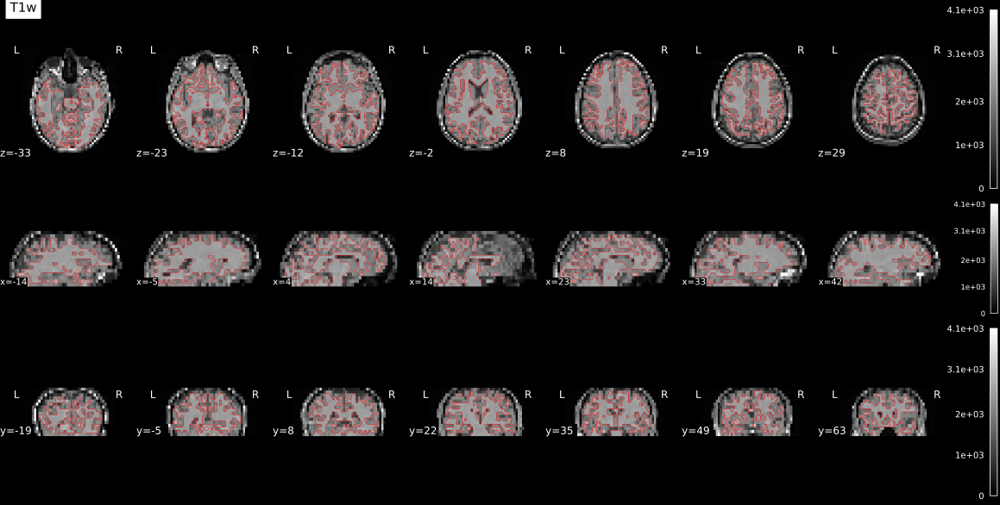

In [9]:
SVG(filename='aslprep-output/sub-01/figures/sub-01_desc-coreg_asl.svg')

### ASL Summary
Summary statistics are plotted, which may reveal trends or artifacts in the ASL data. DVARS and FD show the standardized DVARS and framewise-displacement measures for each time point. A carpet plot shows the time series for all voxels within the brain mask. Voxels are grouped into cortical (blue), and subcortical (orange) gray matter, cerebellum (green) and white matter and CSF (red), indicated by the color map on the left-hand side.


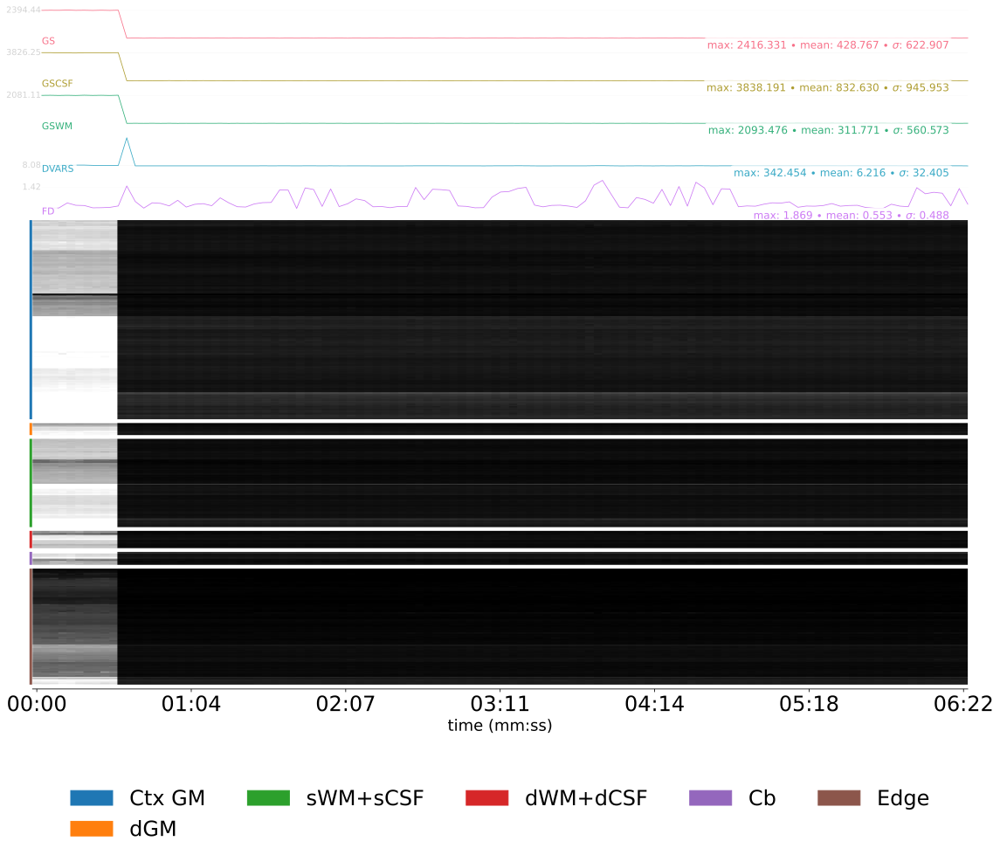

In [19]:
SVG(filename='aslprep-output/sub-01/figures/sub-01_desc-carpetplot_asl.svg')

### CBF
The maps plot cerebral blood flow (CBF) for basic CBF. The unit is mL/100 g/min.

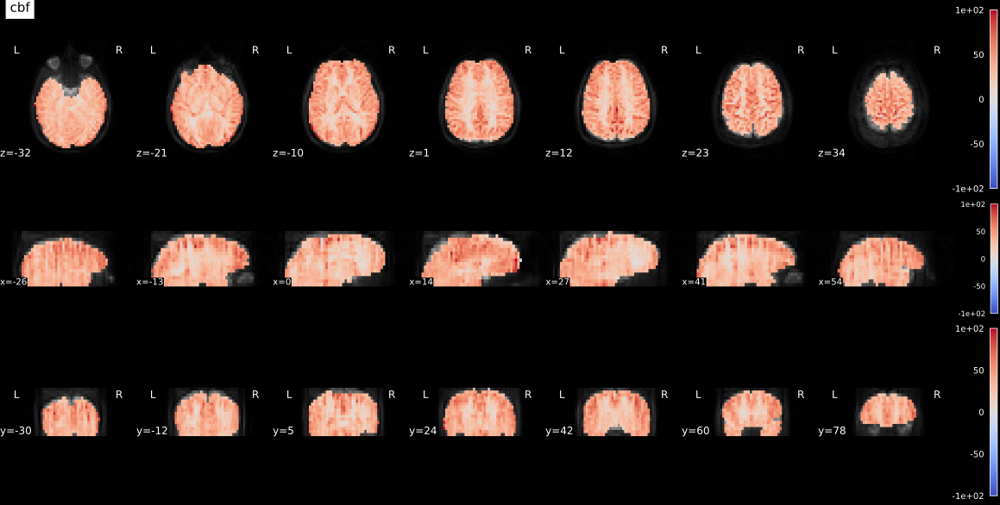

In [18]:
SVG(filename='aslprep-output/sub-01/figures/sub-01_desc-brain_cbf.svg')

#### Dependencies in Jupyter/Python
- Using the package [watermark](https://github.com/rasbt/watermark) to document system environment and software versions used in this notebook, alongside the Neurodesktop version extracted from the `JUPYTER_IMAGE` or `NEURODESKTOP_VERSION` environment variables.

In [12]:
import os

%load_ext watermark

%watermark
%watermark --iversions

neurodesktop_version = (
    os.environ.get('JUPYTER_IMAGE', '').split(':')[-1] or
    os.environ.get('NEURODESKTOP_VERSION', 'unknown')
)

print(f"Neurodesktop version: {neurodesktop_version}")

Last updated: 2026-04-15T03:47:35.356166+00:00

Python implementation: CPython
Python version       : 3.13.11
IPython version      : 9.9.0

Compiler    : GCC 14.3.0
OS          : Linux
Release     : 5.15.0-173-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 30
Architecture: 64bit

IPython: 9.9.0

Neurodesktop version: 2026-03-27
